#Cleaning data 🛁

In [35]:
from google.colab import drive

drive.mount('/gdrive')
%cd /gdrive/MyDrive/[2024-2025]AN2DL/Homework1

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/MyDrive/[2024-2025]AN2DL/Homework1


In [36]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import requests
from io import BytesIO
import cv2
from PIL import Image
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold
import seaborn as sns

seed=42


# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.17.1


## ⏳ Load the Data

In [37]:
data = np.load(
        'training_set.npz'
)
X = data['images']
y = data['labels']

balance = True

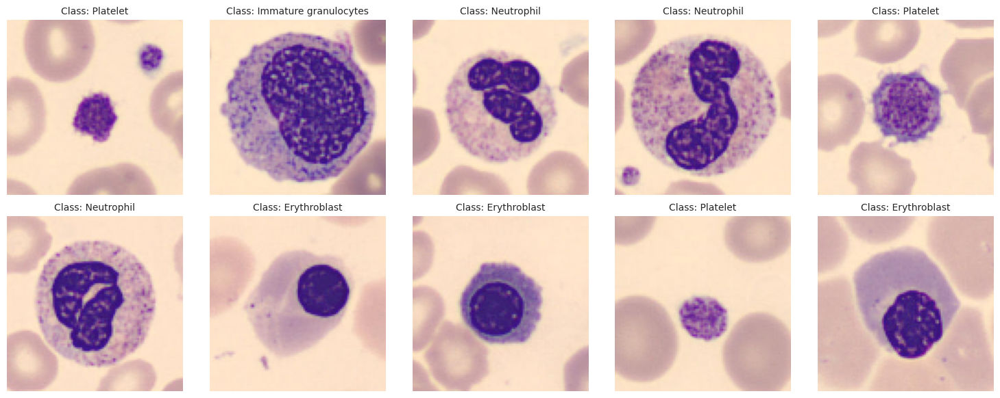

In [38]:

class_mapping = {
    0: "Basophil",
    1: "Eosinophil",
    2: "Erythroblast",
    3: "Immature granulocytes",
    4: "Lymphocyte",
    5: "Monocyte",
    6: "Neutrophil",
    7: "Platelet"
}

def print_images_with_labels(X, y, num_images=10):
  # Define number of columns (fixed to 5, for example)
  num_columns = 5
  # Calculate number of rows based on the number of images
  num_rows = (num_images + num_columns - 1) // num_columns  # This rounds up

  # Create a grid of subplots (dynamically adjusting the number of rows)
  fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 3 * num_rows))

  # Flatten axes to make it easier to iterate over them
  axes = axes.flatten()

  # Loop through the images and display them with their class labels
  for i in range(num_images):
      ax = axes[i]
      ax.imshow(X[i])  # Show the image

      # Ensure y[i] is a scalar value (in case it's an array)
      label = y[i] if isinstance(y[i], (int, np.integer)) else y[i].item()  # Convert to scalar if it's an array
      ax.set_title(f'Class: {class_mapping.get(label, "Unknown")}', fontsize=10)  # Get class name from mapping
      ax.axis('off')  # Hide axis ticks for better display

  plt.tight_layout()  # Adjust the layout to avoid overlap
  plt.show()

def print_every_class(X, y, num_images=10):
  # get 3 images from the 8 categories

  indices = []

  for class_id in range(8):
      # Filter the data for the current class
      class_indices = np.where(y == class_id)[0]

      # Get 3 random images from the current class
      selected_indices = np.random.choice(class_indices, size=3, replace=False)

      indices.extend(selected_indices)


  print_images_with_labels(X[indices], y[indices], num_images=3*8)

def print_on_index(X, y, i):

    # Create a grid of subplots (dynamically adjusting the number of rows)
    fig, axes = plt.subplots(1, 1, figsize=(15, 3 * 1))

    # Flatten axes to make it easier to iterate over them
    axes = axes

    ax = axes
    ax.imshow(X[i])  # Show the image
    # Ensure y[i] is a scalar value (in case it's an array)
    label = y[i] if isinstance(y[i], (int, np.integer)) else y[i].item()  # Convert to scalar if it's an array
    ax.set_title(f'Class: {class_mapping.get(label, "Unknown")}', fontsize=10)  # Get class name from mapping
    ax.axis('off')  # Hide axis ticks for better display




print_images_with_labels(X, y)

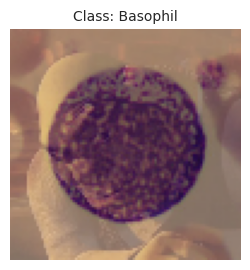

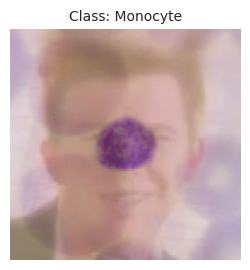

In [39]:
print_on_index(X, y, 12075)
print_on_index(X, y, 13625)


In [40]:
# remove all the images equal to the above ones
outlier1, outlier2 = X[12075], X[13625]
outlier_idx = []
for i, image in enumerate(X):
  if np.array_equal(image, outlier1) or np.array_equal(image, outlier2):
    outlier_idx.append(i)

print(len(outlier_idx))

X = np.delete(X, outlier_idx, axis=0)
y = np.delete(y, outlier_idx, axis=0)

1800


In [41]:
## detect outliers and remove them
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import cv2
from sklearn.preprocessing import FunctionTransformer

def feature_extraction(images):
    features = []
    for image in images:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        features.append(cv2.HuMoments(cv2.moments(gray)).flatten())
    return np.array(features)

scaler = StandardScaler()
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01, random_state=seed)
feature_extractor = FunctionTransformer(feature_extraction, validate=False)

pipeline = Pipeline([('feature_extractor', feature_extractor), ('scaler', scaler), ('isolation_forest', isolation_forest)])

# Fit the pipeline
pipeline.fit(X)


Pipeline(steps=[('feature_extractor',
                 FunctionTransformer(func=<function feature_extraction at 0x7f6b80640d30>)),
                ('scaler', StandardScaler()),
                ('isolation_forest',
                 IsolationForest(contamination=0.01, random_state=42))])

Number of outliers: 120


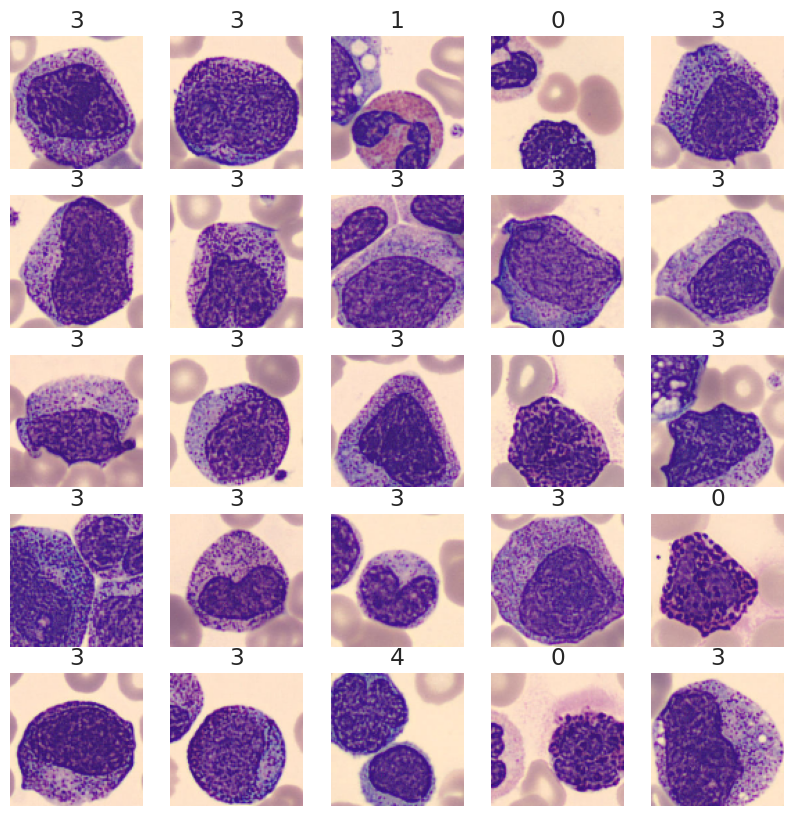

In [42]:
# Predict the outliers
outlier_predictions = pipeline.predict(X)
outlier_idx = np.where(outlier_predictions == -1)[0]
print(f'Number of outliers: {len(outlier_idx)}')

# Plot the outliers
plt.figure(figsize=(10, 10))
for i, idx in enumerate(outlier_idx[:25]):
    plt.subplot(5, 5, i+1)
    label = y[idx] if isinstance(y[idx], (int, np.integer)) else y[idx].item()
    plt.title(label)
    plt.imshow(X[idx])
    plt.axis('off')
plt.show()

In [43]:
## Remove outliers
X = np.delete(X, outlier_idx, axis=0)
y = np.delete(y, outlier_idx, axis=0)

In [44]:
%%capture
!pip install imagededup

In [45]:
## deduplicate using cosine similarity

from sklearn.metrics.pairwise import cosine_similarity

cosines_per_class_matrix = {}

# Threshold for considering two vectors as duplicates
threshold = 0.995

to_keep_indices = []

for cls in np.unique(y):
    # Get indices of all images belonging to the current class
    class_indices = np.where(y == cls)[0]
    X_class = X[class_indices]

    # Compute pairwise cosine similarity for the class
    cosine_sim_matrix = cosine_similarity(X_class.reshape(X_class.shape[0], np.prod(X_class.shape[1:]) ))

    # Store the similarity matrix in the dictionary
    cosines_per_class_matrix[cls] = cosine_sim_matrix

    # Deduplicate images in the class
    unique_indices = []
    for i in range(len(X_class)):
        # Check if the image is a duplicate by comparing its cosine similarity with previous images
        if all(cosine_sim_matrix[i, j] < threshold for j in unique_indices):
            unique_indices.append(i)

    # Filter out the duplicate indices
    X_class_unique = X_class[unique_indices]
    print(f"Class {cls}: Removed {len(X_class) - len(X_class_unique)} duplicates")

    real_index = class_indices[unique_indices]
    to_keep_indices.extend(real_index)


Class 0: Removed 2 duplicates
Class 1: Removed 2 duplicates
Class 2: Removed 9 duplicates
Class 3: Removed 3 duplicates
Class 4: Removed 0 duplicates
Class 5: Removed 1 duplicates
Class 6: Removed 0 duplicates
Class 7: Removed 200 duplicates


In [46]:
print(to_keep_indices)

[26, 38, 42, 47, 78, 80, 85, 90, 110, 160, 171, 191, 244, 250, 270, 273, 289, 296, 298, 336, 383, 386, 402, 413, 422, 438, 441, 445, 452, 462, 465, 477, 481, 484, 505, 520, 551, 573, 628, 632, 644, 645, 668, 682, 700, 707, 746, 750, 751, 760, 766, 786, 797, 808, 867, 897, 904, 906, 959, 963, 995, 1008, 1025, 1036, 1047, 1061, 1074, 1090, 1102, 1107, 1109, 1148, 1158, 1169, 1174, 1205, 1211, 1219, 1237, 1264, 1283, 1287, 1289, 1291, 1310, 1334, 1375, 1377, 1402, 1415, 1419, 1426, 1427, 1443, 1492, 1493, 1496, 1504, 1513, 1571, 1597, 1602, 1618, 1622, 1625, 1632, 1672, 1674, 1677, 1690, 1693, 1697, 1711, 1712, 1745, 1747, 1748, 1749, 1775, 1779, 1785, 1789, 1801, 1803, 1812, 1822, 1866, 1868, 1874, 1904, 1909, 1912, 1930, 1972, 1978, 1980, 1997, 2000, 2005, 2006, 2022, 2027, 2068, 2075, 2088, 2098, 2110, 2124, 2136, 2158, 2165, 2166, 2175, 2203, 2210, 2217, 2245, 2258, 2260, 2266, 2270, 2292, 2297, 2313, 2340, 2345, 2348, 2349, 2363, 2386, 2397, 2400, 2418, 2429, 2432, 2436, 2444, 2447, 

In [47]:
# Select only the indices you want to keep directly
X_filtered = X[to_keep_indices]
y_filtered = y[to_keep_indices]


In [48]:
## Remove redundant images
# from imagededup.methods import CNN
# from collections import Counter
#
# # Initialize the CNN model from imagededup
# cnn = CNN()
#
# # Prepare data structure to hold non-duplicate images and labels
# filtered_X = []
# filtered_y = []
#
# # Process each class separately to maintain balanced classes after deduplication
# for cls in np.unique(y):
#     # Get indices of all images belonging to the current class
#     class_indices = np.where(y == cls)[0]
#     X_class = X[class_indices]
#
#     # Step 1: Generate embeddings for the images in the current class
#     # Convert images to a list format for compatibility with the CNN deduplication
#     encodings = []
#     for img in X_class:
#       encodings.append(cnn.encode_image(image_array=img))
#
#     embeddings = encoding_map = {i: encoding[0] for i, encoding in enumerate(encodings)}
#
#     # Step 2: Find duplicates within this class using a similarity threshold
#     duplicates = cnn.find_duplicates(encoding_map=embeddings, min_similarity_threshold=0.9)  # Adjust threshold as needed
#
#     # Step 3: Filter out duplicates
#     unique_indices = set(range(len(X_class)))  # Start with all images
#     for dup_set in duplicates.values():
#         # Keep only the first image in each duplicate set, remove the rest
#         unique_indices -= set(dup_set[1:])
#
#     # Get filtered images and labels for the current class
#     filtered_X.extend(X_class[list(unique_indices)])
#     filtered_y.extend([cls] * len(unique_indices))
#
# # Convert lists back to numpy arrays
# filtered_X = np.array(filtered_X)
# filtered_y = np.array(filtered_y)
#

In [49]:
from collections import Counter
# Save the filtered dataset
np.savez('deduplicated_training_set.npz', images=X_filtered, labels=y_filtered)


In [50]:
# print number of images per class

unique, counts = np.unique(y_filtered, return_counts=True)
print(np.asarray((unique, counts)))
print(X_filtered.shape)
print(y_filtered.shape)



[[   0    1    2    3    4    5    6    7]
 [ 836 2169 1071 1944  844  986 2329 1443]]
(11622, 96, 96, 3)
(11622, 1)


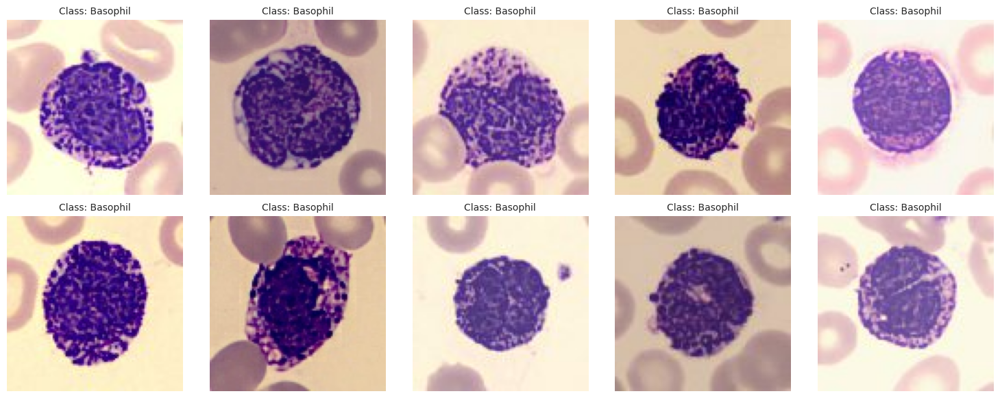

(7010, 1)
(7010, 96, 96, 3)
[[   0    1    2    3    4    5    7]
 [1493  160 1258  385 1485 1343  886]]


In [17]:
## balance the number of images per class
import tensorflow as tf
def random_augmentation(image):
    # Apply random augmentations
    try:
      image = tf.image.random_flip_left_right(image)
      image = tf.image.random_flip_up_down(image)
      image = tf.image.random_brightness(image, max_delta=0.2)
      image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
      image = tf.image.random_saturation(image, lower=0.8, upper=1.2)
      image = tf.image.random_jpeg_quality(image, min_jpeg_quality=75, max_jpeg_quality=100)
    except:
      print("No augmentation:", image)
    return image.numpy()

if balance:
  less_examples = min(counts)
  most_examples = max(counts)

  ## downsample
  # for cls in np.unique(y_filtered):
  #     class_indices = np.where(y_filtered == cls)[0]
  #     nr_to_remove = len(class_indices) - less_examples
#
  #     if nr_to_remove <= 0:
  #         continue
#
  #     selected_indices = np.random.choice(class_indices, size=nr_to_remove, replace=False)
  #     X_filtered = np.delete(X_filtered, selected_indices, axis=0)
  #     y_filtered = np.delete(y_filtered, selected_indices, axis=0)
  #     print(f"Class {cls}: Removed {len(selected_indices)} images")
#
  # unique, counts = np.unique(y_filtered, return_counts=True)
  # print(np.asarray((unique, counts)))

  augmented_images = []
  labels = []

  #upsample
  for cls in np.unique(y_filtered):
      class_indices = np.where(y_filtered == cls)[0]
      nr_to_add = most_examples - len(class_indices)
      if nr_to_add <= 0:
          continue
      selected_indices = np.random.choice(class_indices, size=nr_to_add, replace=True)

      for i in selected_indices:
          original_image = X_filtered[i].copy()
          augmented_image = random_augmentation(original_image)
          augmented_images.append(augmented_image)

          labels.append([cls])

  # Add augmented images to the dataset
  augmented_images = np.array(augmented_images)
  labels = np.array(labels)
  #X_filtered = np.concatenate((X_filtered, augmented_images), axis=0)
  #y_filtered = np.concatenate((y_filtered, labels), axis=0)

  # show one aug image
  print_images_with_labels(augmented_images, labels)

  print(labels.shape)
  print(augmented_images.shape)
  unique, counts = np.unique(labels, return_counts=True)
  print(np.asarray((unique, counts)))

  np.savez('deduplicated_balanced_training_set.npz', images=X_filtered, labels=y_filtered)

In [18]:
X_filtered = np.concatenate((X_filtered, augmented_images), axis=0)
y_filtered = np.concatenate((y_filtered, labels), axis=0)
print(X_filtered.shape)
print(y_filtered.shape)
unique, counts = np.unique(y_filtered, return_counts=True)
print(np.asarray((unique, counts)))
print(labels)


(18632, 96, 96, 3)
(18632, 1)
[[   0    1    2    3    4    5    6    7]
 [2329 2329 2329 2329 2329 2329 2329 2329]]
[[0]
 [0]
 [0]
 ...
 [7]
 [7]
 [7]]


In [19]:
# set X and Y to filter for next steps
X = X_filtered
y = y_filtered

## Removing Red

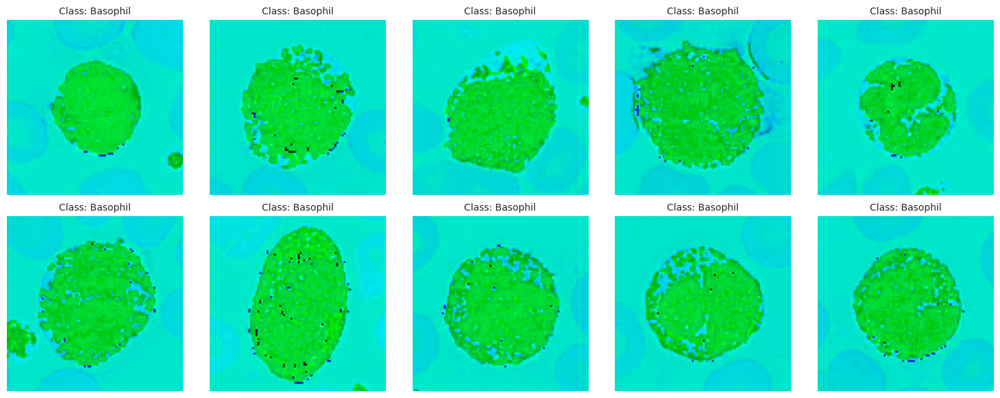

In [20]:
# Assuming 'X' is the image dataset and 'y' are the corresponding labels
first10 = X[0:10]  # Selecting the first 10 images

# Initialize a new array to store the modified images
no_red = np.zeros_like(first10)

for i in range(10):
    img = first10[i]


    no_red[i] = img - img[:, :, 0:1]

# Assuming print_images_with_labels takes in no_red and y
print_images_with_labels(no_red, y[:10])  # Assuming y contains labels for the first 10 images


## Removing Outliers

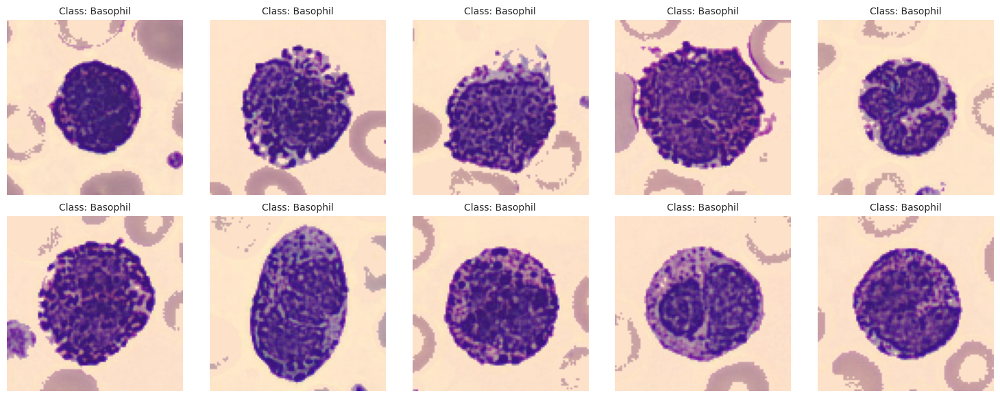

In [21]:
import numpy as np

# Assuming 'X' is the image dataset and 'y' are the corresponding labels
first10 = X[:10]  # Selecting the first 10 images

# Initialize a new array to store the modified images
no_red = np.zeros_like(first10)

# Define the target color and replacement color
target_color = np.array([230, 192, 183])
replacement_color = np.array([253, 225, 201])

# Function to compute Euclidean distance between colors
def color_distance(c1, c2):
    return np.linalg.norm(c1 - c2)

# Iterate over the first 10 images
for i in range(10):
    img = first10[i]

    # Create a copy of the image to modify
    modified_img = img.copy()

    # Create a mask for pixels that are close to the target color
    mask = np.apply_along_axis(lambda pixel: color_distance(pixel, target_color) < 40, axis=-1, arr=img)

    # Replace the colors close to target_color with replacement_color
    modified_img[mask] = replacement_color

    # Store the modified image in the no_red array
    no_red[i] = modified_img

# Assuming print_images_with_labels takes in no_red and y
print_images_with_labels(no_red, y[:10], 10)  # Assuming y contains labels for the first 10 images


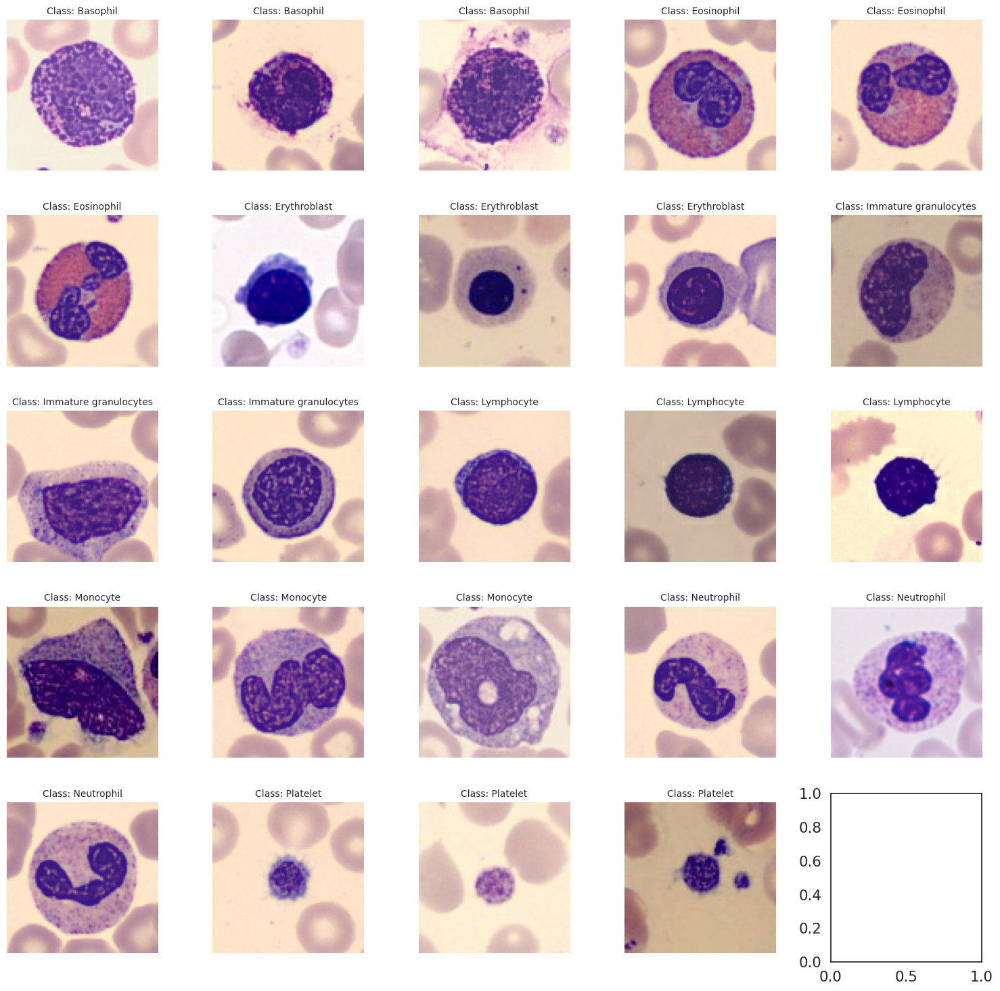

In [22]:
print_every_class(X, y)

In [23]:
def apply_color_replacement(X, target_color=np.array([230, 192, 183]), replacement_color=np.array([253, 225, 201]), threshold=120):
    """
    Applies a color replacement transformation on the entire dataset X without explicit iteration over each image.

    Parameters:
    - X: numpy array of shape (n_samples, height, width, channels), the image dataset
    - target_color: numpy array, the RGB color to replace
    - replacement_color: numpy array, the RGB color to use as a replacement
    - threshold: float, the Euclidean distance threshold to determine color proximity

    Returns:
    - X: The modified dataset with colors replaced in place
    """
    # Calculate the Euclidean distance across the entire dataset in a vectorized manner
    distances = np.linalg.norm(X - target_color, axis=-1)

    # Create a mask for all pixels that are within the threshold distance to the target color
    mask = distances < threshold

    # Broadcast the replacement_color over the RGB channels where the mask is True
    X[mask] = replacement_color

    return X


# apply_color_replacement(X, threshold=60)
# print_images_with_labels(X[:10], y[:10], 10)

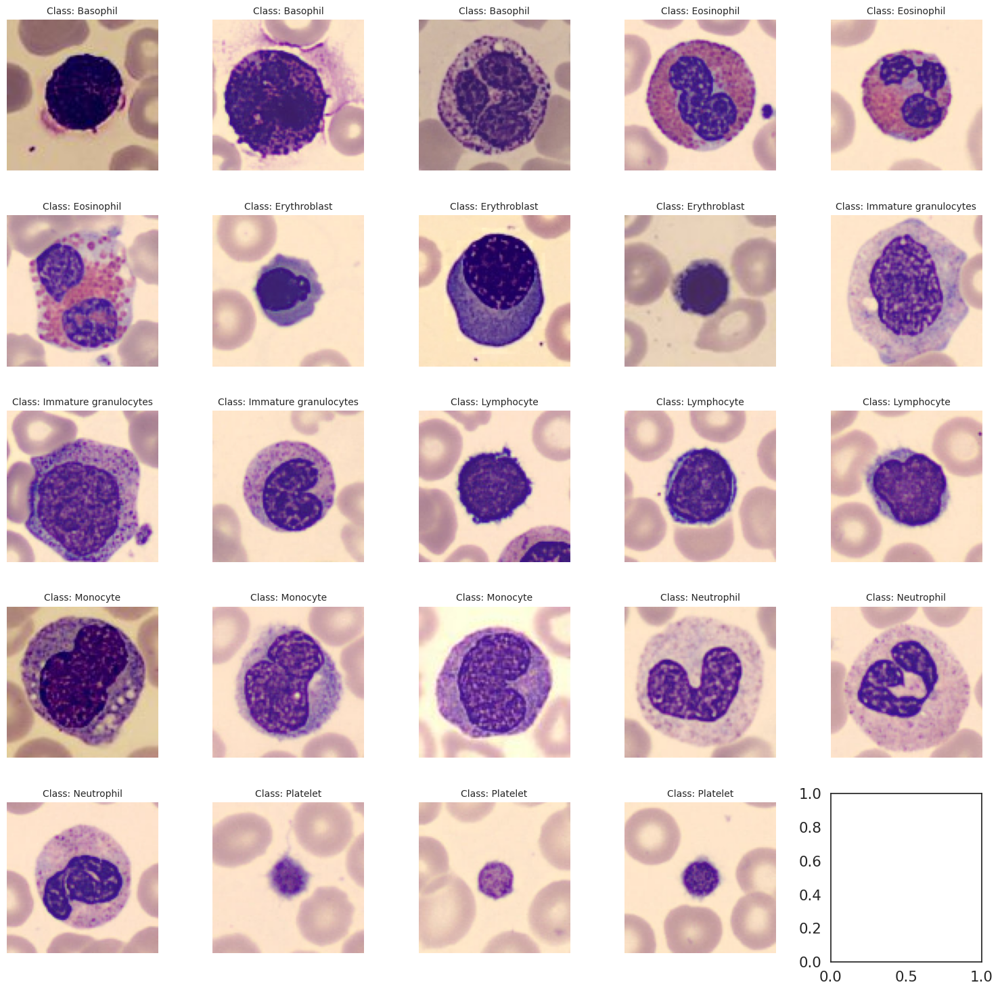

In [24]:
print_every_class(X, y)

## More data analysis

In [25]:
unique, counts = np.unique(y, return_counts=True)
print(np.asarray((unique, counts)).T)

[[   0 2329]
 [   1 2329]
 [   2 2329]
 [   3 2329]
 [   4 2329]
 [   5 2329]
 [   6 2329]
 [   7 2329]]


In [26]:
## range of values

print(f'Min value: {np.min(X)}')
print(f'Max value: {np.max(X)}')

Min value: 0
Max value: 255


In [27]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=seed, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=seed, stratify=y_temp)

class_names =  list(class_mapping.values())

y_train = tfk.utils.to_categorical(y_train, num_classes=len(class_names))
y_val = tfk.utils.to_categorical(y_val, num_classes=len(class_names))

In [28]:
# shape of train, val and test
print(f'X_train shape: {X_train.shape}')
print(f'X_val shape: {X_val.shape}')
print(f'X_test shape: {X_test.shape}')

X_train shape: (14905, 96, 96, 3)
X_val shape: (1863, 96, 96, 3)
X_test shape: (1864, 96, 96, 3)


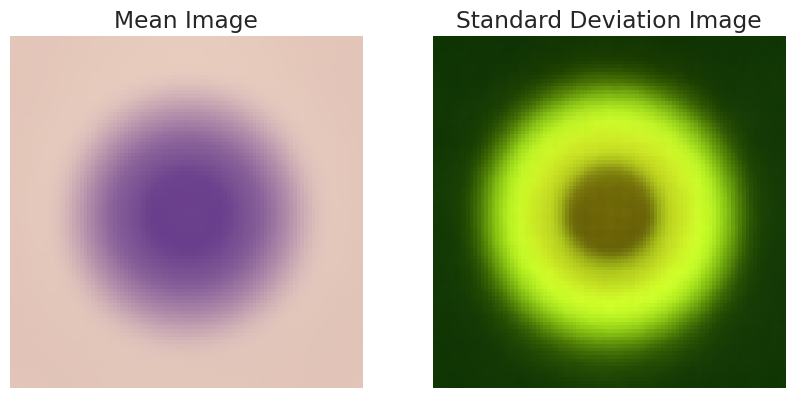

In [29]:
## min average image and standard image

mean_image = np.mean(X, axis=0)

# Calculate the standard deviation image
std_image = np.std(X, axis=0)


# Plot the images
plt.figure(figsize=(10, 5))

# Display the mean image
plt.subplot(1, 2, 1)
plt.imshow(mean_image.astype(np.uint8))  # Convert to uint8 if needed
plt.title("Mean Image")
plt.axis("off")

# Display the standard deviation image
# Normalize std_image to [0, 255] for better visibility, if necessary
std_display = (std_image - np.min(std_image)) / (np.max(std_image) - np.min(std_image)) * 255
plt.subplot(1, 2, 2)
plt.imshow(std_display.astype(np.uint8))
plt.title("Standard Deviation Image")
plt.axis("off")

plt.show()

In [30]:
## store mean image and standard image onto a file

np.save('mean_image.npy', mean_image)
np.save('std_image.npy', std_image)

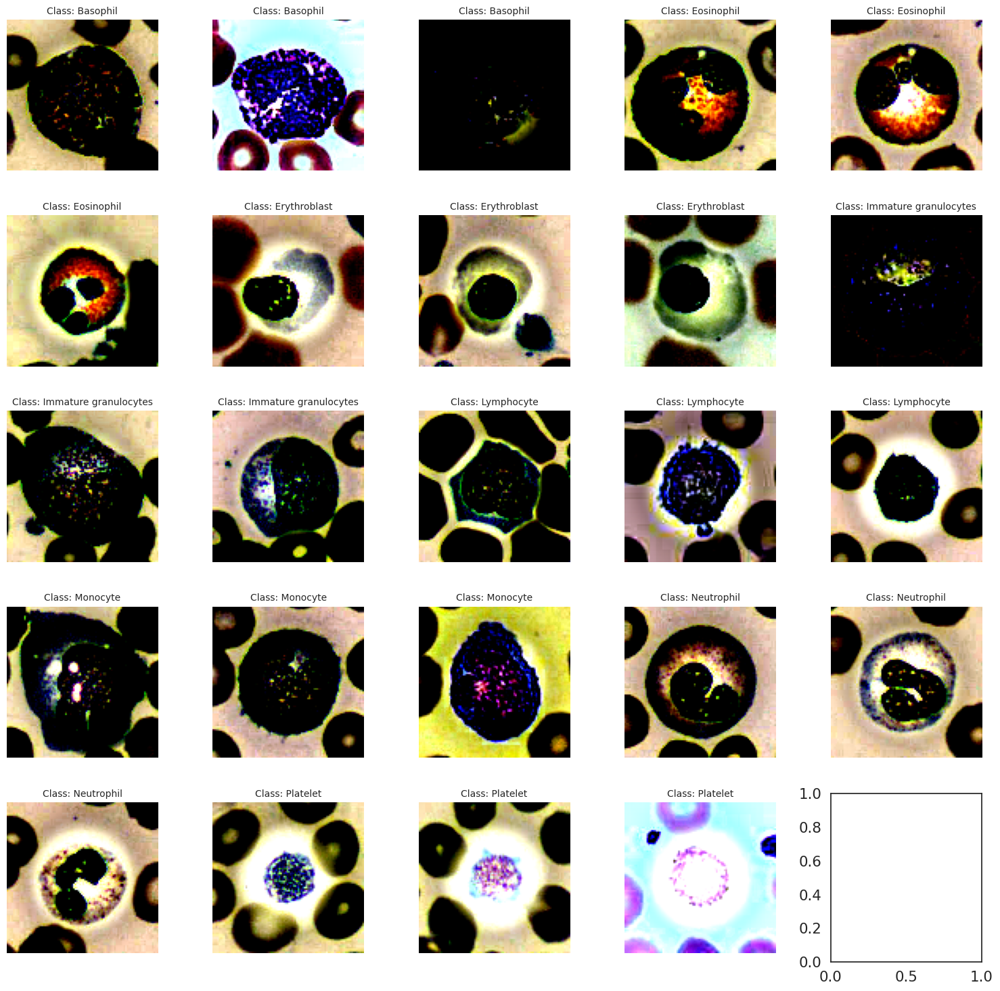

In [31]:
## normalize images

X_norm = (X - mean_image) / std_image

print_every_class(X_norm, y)

## Save cleaned data

In [32]:
## save X into a npz file

if balance:
  np.savez('cleaned_data_dedup_balanced.npz', images=X, labels=y)
else:
  np.savez('cleaned_data_dedup.npz', images=X, labels=y)

#np.savez('cleaned_data_dedup_balanced_normalized.npz', images=X_norm, labels=y)

### Analyse Prediction made in test server

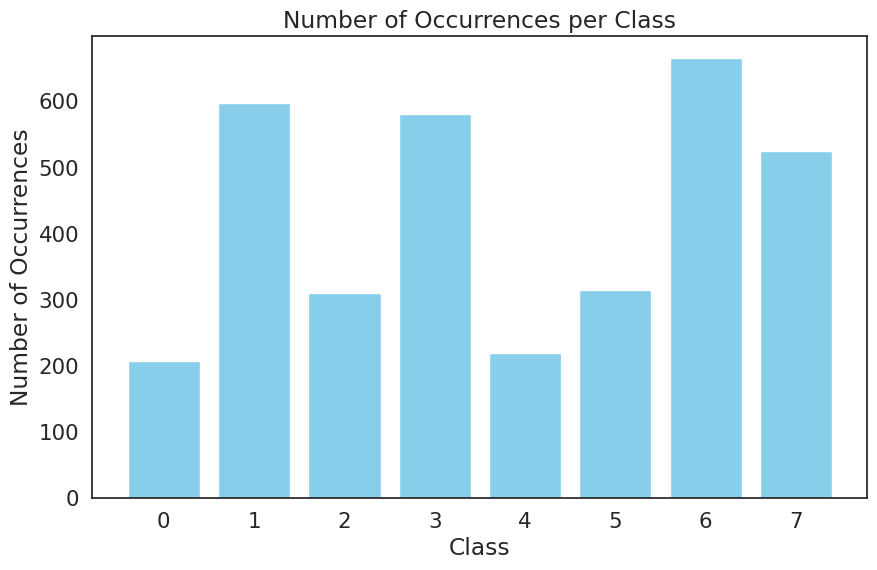

In [33]:
import matplotlib.pyplot as plt
from collections import Counter

# Step 1: Read the file and count occurrences
with open('prediction.txt', 'r') as f:
    lines = f.readlines()

# Convert lines to integers (strip any whitespace or newline characters)
class_numbers = [float(line.strip()) for line in lines]

# Step 2: Count occurrences of each class
class_counts = Counter(class_numbers)

# Step 3: Plot the results
classes = list(class_counts.keys())
counts = list(class_counts.values())

plt.figure(figsize=(10, 6))
plt.bar(classes, counts, color='skyblue')
plt.xlabel('Class')
plt.ylabel('Number of Occurrences')
plt.title('Number of Occurrences per Class')
plt.xticks(classes)  # Ensure each class is labeled on the x-axis
plt.show()


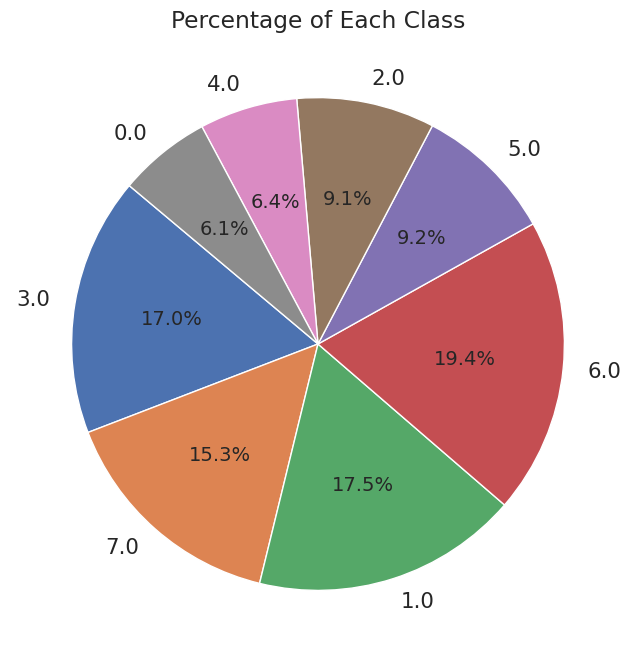

In [34]:
# Step 3: Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=classes, autopct='%1.1f%%', startangle=140)
plt.title('Percentage of Each Class')
plt.show()